<a href="https://colab.research.google.com/github/lucas26xd/registrosPRF/blob/master/scrub_explore_data.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>


#**Dados abertos sobre Acidentes da Polícia Rodoviária Federal**

---



### Lendo as bases de dados

In [73]:
import pandas as pd
!pip install plotly==4.10.0
import plotly.express as px
import seaborn as sn
import matplotlib.pyplot as plt

url = 'https://raw.githubusercontent.com/lucas26xd/registrosPRF/master/Bases'
bases = {'Ocorrencias': {'folder': 'Agrupados%20por%20ocorrencia', 
                         'files': ['datatran2017.csv', 'datatran2018.csv', 'datatran2019.csv', 'datatran2020.csv']}, 
         'Pessoas': {'folder': 'Agrupados%20por%20pessoa', 
                     'files': ['acidentes2017.csv', 'acidentes2018.csv', 'acidentes2019.csv', 'acidentes2020.csv']}, 
         }

def import_base(base):
  dfs = list()
  for file in bases[base]['files']:
    dfs.append(pd.read_csv(f'{url}/{bases[base]["folder"]}/{file}', encoding='ISO-8859-1', sep=';'))

  return pd.concat(dfs)

# Funções globais
def testa_valores_nulos(df, atrib):
  if sum(df[atrib].isnull()) == 0:
    print('\033[94m', atrib, ' => OK (não tem valores nulos)')
  else:
    print('\033[93m', atrib, ' => *** TEM VALORES NULOS')

def testa_valores_null(df, atrib):
  if sum(df[atrib] == '(null)') == 0:
    print('\033[92m', atrib, ' => OK (não tem valores "(null)")')
  else:
    print('\033[91m', atrib, ' => *** TEM VALORES "(null)"')
  
def testa_tipos(df, atrib, tipo):
  s = sum(df[atrib].map(type) != tipo)
  if s == 0: 
    print('\033[92m', f'{atrib} => todos são {tipo}')
  else: 
    print('\033[91m', f'{atrib} => *** {s} ATRIBUTOS NÃO SÃO {tipo}')

def converte_srt_to_float(df, atrib):
  for i in range(0, len(atrib)):
    df[atrib[i]] = df[atrib[i]].apply(lambda x: x.replace(",", "."))
    df[atrib[i]] = df[atrib[i]].astype(float)

def converte_float_to_int(df, atrib):
  for i in range(0, len(atrib)):
    df[atrib[i]] = df[atrib[i]].astype(int)

# **Etapa Limpeza**
Para a etapa de limpeza, foi optado, a priori, pelo estudo e análise das três bases disponibilizadas pela PRF separadamente, onde cada uma delas possuem *sub-bases* correspondentes ao anos referentes aos dados coletados:
-   **Agrupados por ocorrência**;
-  **Agrupados por pessoa**;
-  **Agrupados por pessoa - Todas as causas e tipos de acidentes (a partir de 2017)**.
 	> Optou-se em desconsiderar esta base, por apresentar atributos inclusos nas outras bases, evitando redundância.
 
O desenvolvimento da etapa segue fases aplicadas a cada base, tais foram:
1. Levantamento de todos os atributos de cada *sub-base* (ano);
	> A partir da visualização dos atributos presentes nas *sub-bases*, optou-se por aplicar as fases seguintes às *sub-bases* dos anos 2017 à 2020, devido uma melhor consistência e clareza dos dados.
2. Selecionar os atributos a serem **mantidos** e os a serem **descartados**;
3. Concatenação das *sub-bases*;
4. Analisar cada atributo;
  >Verificar quais possuem valores nulos e os tipos dos dados
5. Tratar e padronizar cada atributo.

## Base 1: **Agrupados por ocorrência**



---


- Atributos a serem **MANTIDOS**: 

|Atributos                |Critério utilizado                               |                
|----------------|-------------------------------|
|id|Relacionamento com a base *Agrupamento por pessoa*  |     
|data_inversa, dia_semana, horario|Tempo, período           |            
|uf, br, km, municipio|Localização geográfica|
| causa_acidente, tipo_acidente, classificação_acidente |Características do acidente |
|pessoas, ilesos, feridos_leves, feridos_graves, mortos, ignorados, feridos, veiculos|Características quantitativas dos meios envolvidos|
|condicao_metereologica|Característica Meteorológica|
|tipo_pista, tracado_via|Características espaço físico da ocorrência|
|tipo_veiculo |Característica do meio motor da ocorrência|

- Atributos a serem **REMOVIDOS**: 

|Atributos                |Critério utilizado                               |                
|----------------|-------------------------------|
|fase_dia, ano, latitude, longitude, regional|Podem ser derivados de outros atributos |
|sentido_via, uso_solo, uop, delegacia | Confusos e Dispensáveis |


In [74]:
# UNINDO AS 4 ÚLTIMAS BASES DE OCORRÊNCIAS (2017 a 2020)
dfOcorrencias = import_base('Ocorrencias')
dfOcorrencias.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 260388 entries, 0 to 34083
Data columns (total 30 columns):
 #   Column                  Non-Null Count   Dtype  
---  ------                  --------------   -----  
 0   id                      260388 non-null  float64
 1   data_inversa            260388 non-null  object 
 2   dia_semana              260388 non-null  object 
 3   horario                 260388 non-null  object 
 4   uf                      260388 non-null  object 
 5   br                      259955 non-null  float64
 6   km                      259955 non-null  object 
 7   municipio               260388 non-null  object 
 8   causa_acidente          260388 non-null  object 
 9   tipo_acidente           260388 non-null  object 
 10  classificacao_acidente  260388 non-null  object 
 11  fase_dia                260388 non-null  object 
 12  sentido_via             260388 non-null  object 
 13  condicao_metereologica  260388 non-null  object 
 14  tipo_pista           

In [75]:
# REMOÇÃO DE ATRIBUTOS DA BASE OCORRÊNCIAS
dfOcorrencias = dfOcorrencias.drop(columns=['fase_dia', 'sentido_via', 'uso_solo', 'latitude', 'longitude', 'regional', 'delegacia', 'uop'])
dfOcorrencias

,id,data_inversa,dia_semana,horario,uf,br,km,municipio,causa_acidente,tipo_acidente,classificacao_acidente,condicao_metereologica,tipo_pista,tracado_via,pessoas,mortos,feridos_leves,feridos_graves,ilesos,ignorados,feridos,veiculos
0,8.0,2017-01-01,domingo,00:00:00,PR,376.0,112,PARANAVAI,Fenômenos da Natureza,Queda de ocupante de veículo,Com Vítimas Feridas,Chuva,Simples,Reta,1,0,0,1,0,0,1,1
1,9.0,2017-01-01,domingo,00:01:00,SC,101.0,234,PALHOCA,Falta de Atenção à Condução,Colisão com objeto estático,Sem Vítimas,Chuva,Dupla,Curva,1,0,0,0,1,0,0,1
2,11.0,2017-01-01,domingo,00:00:00,PR,153.0,"56,9",SANTO ANTONIO DA PLATINA,Animais na Pista,Capotamento,Com Vítimas Feridas,Garoa/Chuvisco,Simples,Reta,2,0,2,0,0,0,2,1
3,12.0,2017-01-01,domingo,00:00:00,GO,153.0,435,ANAPOLIS,Avarias e/ou desgaste excessivo no pneu,Tombamento,Com Vítimas Feridas,Céu Claro,Dupla,Reta,1,0,0,1,0,0,1,1
4,13.0,2017-01-01,domingo,00:00:00,SC,280.0,"77,3",CORUPA,Ingestão de Álcool,Saída de leito carroçável,Com Vítimas Feridas,Chuva,Simples,Não Informado,1,0,1,0,0,0,1,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
34079,304089.0,2020-02-02,domingo,15:30:00,MG,40.0,"638,4",CONSELHEIRO LAFAIETE,Velocidade Incompatível,Colisão frontal,Com Vítimas Fatais,Chuva,Simples,Não Informado,6,2,1,2,1,0,3,3
34080,304099.0,2020-07-24,sexta-feira,23:20:00,SC,101.0,192,BIGUACU,Desobediência às normas de trânsito pelo pedestre,Atropelamento de Pedestre,Com Vítimas Fatais,Céu Claro,Dupla,Reta,4,1,0,0,3,0,0,1
34081,304106.0,2020-04-30,quinta-feira,15:00:00,MG,116.0,276,TEOFILO OTONI,Objeto estático sobre o leito carroçável,Danos eventuais,Com Vítimas Feridas,Ignorado,Dupla,Reta,1,0,1,0,0,0,1,1
34082,304279.0,2020-04-15,quarta-feira,18:00:00,PR,277.0,1,PARANAGUA,Falta de Atenção à Condução,Colisão traseira,Com Vítimas Feridas,Céu Claro,Simples,Reta,1,0,0,1,0,0,1,1


In [76]:
# VERIFICAÇÃO DE NULOS DA BASE OCORRÊNCIAS
print('-'*30, 'VALORES NULOS', '-'*30)
for attr in dfOcorrencias.columns:
  testa_valores_nulos(dfOcorrencias, attr)

print('\033[0m', '-'*30, 'VALORES (NULL)', '-'*30)
for attr in dfOcorrencias.columns:
  testa_valores_null(dfOcorrencias, attr)

------------------------------ VALORES NULOS ------------------------------
 id  => OK (não tem valores nulos)
 data_inversa  => OK (não tem valores nulos)
 dia_semana  => OK (não tem valores nulos)
 horario  => OK (não tem valores nulos)
 uf  => OK (não tem valores nulos)
 br  => *** TEM VALORES NULOS
 km  => *** TEM VALORES NULOS
 municipio  => OK (não tem valores nulos)
 causa_acidente  => OK (não tem valores nulos)
 tipo_acidente  => OK (não tem valores nulos)
 classificacao_acidente  => OK (não tem valores nulos)
 condicao_metereologica  => OK (não tem valores nulos)
 tipo_pista  => OK (não tem valores nulos)
 tracado_via  => OK (não tem valores nulos)
 pessoas  => OK (não tem valores nulos)
 mortos  => OK (não tem valores nulos)
 feridos_leves  => OK (não tem valores nulos)
 feridos_graves  => OK (não tem valores nulos)
 ilesos  => OK (não tem valores nulos)
 ignorados  => OK (não tem valores nulos)
 feridos  => OK (não tem valores nulos)
 veiculos  => OK (não tem valores nulos)


/usr/local/lib/python3.6/dist-packages/pandas/core/ops/array_ops.py:253: FutureWarning:

elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison



 causa_acidente  => OK (não tem valores "(null)")
 tipo_acidente  => OK (não tem valores "(null)")
 classificacao_acidente  => OK (não tem valores "(null)")
 condicao_metereologica  => OK (não tem valores "(null)")
 tipo_pista  => OK (não tem valores "(null)")
 tracado_via  => OK (não tem valores "(null)")
 pessoas  => OK (não tem valores "(null)")
 mortos  => OK (não tem valores "(null)")
 feridos_leves  => OK (não tem valores "(null)")
 feridos_graves  => OK (não tem valores "(null)")
 ilesos  => OK (não tem valores "(null)")
 ignorados  => OK (não tem valores "(null)")
 feridos  => OK (não tem valores "(null)")
 veiculos  => OK (não tem valores "(null)")


In [77]:
# VERIFICAÇÃO DE TIPOS DA BASE OCORRÊNCIAS
atributos_str = ["data_inversa", "dia_semana", "horario", "uf", "municipio", "causa_acidente","tipo_acidente", "classificacao_acidente", "condicao_metereologica", "tipo_pista", "tracado_via"]
atributos_int = ["id", "br", "pessoas", "mortos", "feridos_leves", "feridos_graves", "ilesos", "ignorados", "feridos", "veiculos"]
atributos_float = ["km"]

print('\033[0m', 'Atributos que devem ser STR')
for attr in atributos_str:
    testa_tipos(dfOcorrencias, attr, str)

print('\033[0m', 'Atributos que devem ser INT')
for attr in atributos_int:
    testa_tipos(dfOcorrencias, attr, int)

print('\033[0m', 'Atributos que devem ser FLOAT')
for attr in atributos_float:
    testa_tipos(dfOcorrencias, attr, float)

print('\033[0m', 'Quantidade de DATA INVERSA FORA DO PADRÃO AAAA-MM-DD =', sum(~dfOcorrencias['data_inversa'].str.match('[0-9]{4}-[0-9]{2}-[0-9]{2}')))
print('\033[0m', 'Quantidade de HORÁRIO FORA DO PADRÃO HH:MM:SS =', sum(~dfOcorrencias['horario'].str.match('[0-9]{2}:[0-9]{2}:[0-9]{2}')))

 Atributos que devem ser STR
 data_inversa => todos são <class 'str'>
 dia_semana => todos são <class 'str'>
 horario => todos são <class 'str'>
 uf => todos são <class 'str'>
 municipio => todos são <class 'str'>
 causa_acidente => todos são <class 'str'>
 tipo_acidente => todos são <class 'str'>
 classificacao_acidente => todos são <class 'str'>
 condicao_metereologica => todos são <class 'str'>
 tipo_pista => todos são <class 'str'>
 tracado_via => todos são <class 'str'>
 Atributos que devem ser INT
 id => *** 260388 ATRIBUTOS NÃO SÃO <class 'int'>
 br => *** 260388 ATRIBUTOS NÃO SÃO <class 'int'>
 pessoas => todos são <class 'int'>
 mortos => todos são <class 'int'>
 feridos_leves => todos são <class 'int'>
 feridos_graves => todos são <class 'int'>
 ilesos => todos são <class 'int'>
 ignorados => todos são <class 'int'>
 feridos => todos são <class 'int'>
 veiculos => todos são <class 'int'>
 Atributos que devem ser FLOAT
 km => *** 259955 ATRIBUTOS NÃO SÃO <class 'float'>
 Quant

---

- Tratamento especiais dos atributos
	- Remove-se registros com valores dos atributos 'br' e 'km' nulos, pois são apresentados em quantidade irrelevante;

---

- Padronização dos atributos **MANTIDOS**: 

|Atributos                |Tipo padronizado                               |                
|----------------|-------------------------------|
|dia_semana, uf, municipio, causa_acidente, tipo_acidente, classificacao_acidente, condicao_metereologica, tipo_pista, tracado_via, tipo_veiculo, tipo_envolvido, estado_fisico, sexo| String (str)|
|id, br, pessoas, ilesos, feridos_leves, feridos_graves, mortos, ignorados, feridos, veiculos|Inteiro (int)|
|km| Float|
|data_inversa| String AAAA-MM-DD|
|horario|String HH:MM:SS|

In [78]:
# LIMPEZA BASE OCORRÊNCAS

## Remove regitros com atributos br e km NaN
t = len(dfOcorrencias.id)
dfOcorrencias = dfOcorrencias[dfOcorrencias['br'].notna()]
dfOcorrencias = dfOcorrencias[dfOcorrencias['km'].notna()] # Nem precisava, onde br é NaN, km também é
print(f'Removidos {t - len(dfOcorrencias.id)} registros.')

## Conversões
converte_float_to_int(dfOcorrencias, atributos_int)

converte_srt_to_float(dfOcorrencias, atributos_float)

dfOcorrencias['data_inversa'] = pd.to_datetime(dfOcorrencias['data_inversa'])
dfOcorrencias['horario'] = pd.to_datetime(dfOcorrencias['horario'])

Removidos 433 registros.


In [79]:
dfOcorrencias.info()
dfOcorrencias.head()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 259955 entries, 0 to 34083
Data columns (total 22 columns):
 #   Column                  Non-Null Count   Dtype         
---  ------                  --------------   -----         
 0   id                      259955 non-null  int64         
 1   data_inversa            259955 non-null  datetime64[ns]
 2   dia_semana              259955 non-null  object        
 3   horario                 259955 non-null  datetime64[ns]
 4   uf                      259955 non-null  object        
 5   br                      259955 non-null  int64         
 6   km                      259955 non-null  float64       
 7   municipio               259955 non-null  object        
 8   causa_acidente          259955 non-null  object        
 9   tipo_acidente           259955 non-null  object        
 10  classificacao_acidente  259955 non-null  object        
 11  condicao_metereologica  259955 non-null  object        
 12  tipo_pista              259955 

,id,data_inversa,dia_semana,horario,uf,br,km,municipio,causa_acidente,tipo_acidente,classificacao_acidente,condicao_metereologica,tipo_pista,tracado_via,pessoas,mortos,feridos_leves,feridos_graves,ilesos,ignorados,feridos,veiculos
0,8,2017-01-01,domingo,2020-09-28 00:00:00,PR,376,112.0,PARANAVAI,Fenômenos da Natureza,Queda de ocupante de veículo,Com Vítimas Feridas,Chuva,Simples,Reta,1,0,0,1,0,0,1,1
1,9,2017-01-01,domingo,2020-09-28 00:01:00,SC,101,234.0,PALHOCA,Falta de Atenção à Condução,Colisão com objeto estático,Sem Vítimas,Chuva,Dupla,Curva,1,0,0,0,1,0,0,1
2,11,2017-01-01,domingo,2020-09-28 00:00:00,PR,153,56.9,SANTO ANTONIO DA PLATINA,Animais na Pista,Capotamento,Com Vítimas Feridas,Garoa/Chuvisco,Simples,Reta,2,0,2,0,0,0,2,1
3,12,2017-01-01,domingo,2020-09-28 00:00:00,GO,153,435.0,ANAPOLIS,Avarias e/ou desgaste excessivo no pneu,Tombamento,Com Vítimas Feridas,Céu Claro,Dupla,Reta,1,0,0,1,0,0,1,1
4,13,2017-01-01,domingo,2020-09-28 00:00:00,SC,280,77.3,CORUPA,Ingestão de Álcool,Saída de leito carroçável,Com Vítimas Feridas,Chuva,Simples,Não Informado,1,0,1,0,0,0,1,1


## Base 2: **Agrupados por pessoa**



---


- Atributos a serem **MANTIDOS**: 

|Atributos                |Critério utilizado                               |                
|----------------|-------------------------------|
|id, pesid|Relacionamento com a base *Agrupamento por ocorrência*  |     
|data_inversa, dia_semana, horario|Tempo, período           |            
|uf, br, km, municipio|Localização geográfica|
| causa_acidente, tipo_acidente, classificação_acidente |Características do acidente |
|tipo_envolvido, estado_fisico, idade, sexo, ilesos, feridos_leves, feridos_graves, mortos|Características, estado da pessoa envolvida|
|condicao_metereologica|Característica Meteorológica|
|tracado_via|Características espaço físico da ocorrência|
|tipo_veiculo |Característica do meio motor da ocorrência|

- Atributos a serem **REMOVIDOS**: 

|Atributos                |Critério utilizado                               |                
|----------------|-------------------------------|
|fase_dia, latitude, longitude, regional|Podem ser derivados de outros atributos |
|sentido_via, uso_solo, uop, id_veiculo, marca, ano_fabricacao_veiculo, delegacia | Confusos e Dispensáveis |




In [80]:
# UNINDO AS 4 ÚLTIMAS BASES DE PESSOAS (2017 a 2020)
dfPessoas = import_base('Pessoas')
dfPessoas.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 609882 entries, 0 to 78411
Data columns (total 35 columns):
 #   Column                  Non-Null Count   Dtype  
---  ------                  --------------   -----  
 0   id                      609882 non-null  float64
 1   pesid                   609878 non-null  float64
 2   data_inversa            609882 non-null  object 
 3   dia_semana              609882 non-null  object 
 4   horario                 609882 non-null  object 
 5   uf                      609882 non-null  object 
 6   br                      608891 non-null  float64
 7   km                      608891 non-null  object 
 8   municipio               609882 non-null  object 
 9   causa_acidente          609882 non-null  object 
 10  tipo_acidente           609882 non-null  object 
 11  classificacao_acidente  609882 non-null  object 
 12  fase_dia                609882 non-null  object 
 13  sentido_via             609882 non-null  object 
 14  condicao_metereologic

In [81]:
# REMOÇÃO DE ATRIBUTOS DA BASE PESSOAS
dfPessoas = dfPessoas.drop(columns=['fase_dia', 'sentido_via', 'uso_solo', 'id_veiculo', 'marca', 'ano_fabricacao_veiculo', 'latitude', 'longitude', 'regional', 'delegacia', 'uop'])
dfPessoas.shape

(609882, 24)

In [82]:
# VERIFICAÇÃO DE NULOS DA BASE PESSOAS
print('-'*30, 'VALORES NULOS', '-'*30)
for attr in dfPessoas.columns:
  testa_valores_nulos(dfPessoas, attr)

print('\033[0m', '-'*30, 'VALORES (NULL)', '-'*30)
for attr in dfPessoas.columns:
  testa_valores_null(dfPessoas, attr)

------------------------------ VALORES NULOS ------------------------------
 id  => OK (não tem valores nulos)
 pesid  => *** TEM VALORES NULOS
 data_inversa  => OK (não tem valores nulos)
 dia_semana  => OK (não tem valores nulos)
 horario  => OK (não tem valores nulos)
 uf  => OK (não tem valores nulos)
 br  => *** TEM VALORES NULOS
 km  => *** TEM VALORES NULOS
 municipio  => OK (não tem valores nulos)
 causa_acidente  => OK (não tem valores nulos)
 tipo_acidente  => OK (não tem valores nulos)
 classificacao_acidente  => OK (não tem valores nulos)
 condicao_metereologica  => OK (não tem valores nulos)
 tipo_pista  => OK (não tem valores nulos)
 tracado_via  => OK (não tem valores nulos)
 tipo_veiculo  => OK (não tem valores nulos)
 tipo_envolvido  => OK (não tem valores nulos)
 estado_fisico  => OK (não tem valores nulos)
 idade  => *** TEM VALORES NULOS
 sexo  => OK (não tem valores nulos)
 ilesos  => OK (não tem valores nulos)
 feridos_leves  => OK (não tem valores nulos)
 feridos

/usr/local/lib/python3.6/dist-packages/pandas/core/ops/array_ops.py:253: FutureWarning:

elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison



 dia_semana  => OK (não tem valores "(null)")
 horario  => OK (não tem valores "(null)")
 uf  => OK (não tem valores "(null)")
 br  => OK (não tem valores "(null)")
 km  => OK (não tem valores "(null)")
 municipio  => OK (não tem valores "(null)")
 causa_acidente  => OK (não tem valores "(null)")
 tipo_acidente  => OK (não tem valores "(null)")
 classificacao_acidente  => OK (não tem valores "(null)")
 condicao_metereologica  => OK (não tem valores "(null)")
 tipo_pista  => OK (não tem valores "(null)")
 tracado_via  => OK (não tem valores "(null)")
 tipo_veiculo  => OK (não tem valores "(null)")
 tipo_envolvido  => OK (não tem valores "(null)")
 estado_fisico  => OK (não tem valores "(null)")
 idade  => OK (não tem valores "(null)")
 sexo  => OK (não tem valores "(null)")
 ilesos  => OK (não tem valores "(null)")
 feridos_leves  => OK (não tem valores "(null)")
 feridos_graves  => OK (não tem valores "(null)")
 mortos  => OK (não tem valores "(null)")


In [83]:
# VERIFICAÇÃO DE TIPOS DA BASE PESSOAS
atributos_str = ['data_inversa', 'dia_semana', 'horario', 'uf', 'municipio', 'causa_acidente', 'tipo_acidente', 'classificacao_acidente', 'condicao_metereologica', 'tipo_pista', 'tracado_via', 'tipo_veiculo', 'tipo_envolvido', 'estado_fisico', 'sexo']
atributos_int = ['id', 'pesid', 'br', 'idade', 'ilesos', 'feridos_leves', 'feridos_graves', 'mortos']
atributos_float = ['km']

print('\033[0m', 'Atributos que devem ser STR')
for attr in atributos_str:
    testa_tipos(dfPessoas, attr, str)

print('\033[0m', 'Atributos que devem ser INT')
for attr in atributos_int:
    testa_tipos(dfPessoas, attr, int)

print('\033[0m', 'Atributos que devem ser FLOAT')
for attr in atributos_float:
    testa_tipos(dfPessoas, attr, float)

print('\033[0m', 'Quantidade de DATA INVERSA FORA DO PADRÃO AAAA-MM-DD =', sum(~dfPessoas['data_inversa'].str.match('[0-9]{4}-[0-9]{2}-[0-9]{2}')))
print('\033[0m', 'Quantidade de HORÁRIO FORA DO PADRÃO HH:MM:SS =', sum(~dfPessoas['horario'].str.match('[0-9]{2}:[0-9]{2}:[0-9]{2}')))

 Atributos que devem ser STR
 data_inversa => todos são <class 'str'>
 dia_semana => todos são <class 'str'>
 horario => todos são <class 'str'>
 uf => todos são <class 'str'>
 municipio => todos são <class 'str'>
 causa_acidente => todos são <class 'str'>
 tipo_acidente => todos são <class 'str'>
 classificacao_acidente => todos são <class 'str'>
 condicao_metereologica => todos são <class 'str'>
 tipo_pista => todos são <class 'str'>
 tracado_via => todos são <class 'str'>
 tipo_veiculo => todos são <class 'str'>
 tipo_envolvido => todos são <class 'str'>
 estado_fisico => todos são <class 'str'>
 sexo => todos são <class 'str'>
 Atributos que devem ser INT
 id => *** 609882 ATRIBUTOS NÃO SÃO <class 'int'>
 pesid => *** 609882 ATRIBUTOS NÃO SÃO <class 'int'>
 br => *** 609882 ATRIBUTOS NÃO SÃO <class 'int'>
 idade => *** 609882 ATRIBUTOS NÃO SÃO <class 'int'>
 ilesos => todos são <class 'int'>
 feridos_leves => todos são <class 'int'>
 feridos_graves => todos são <class 'int'>
 morto



---


- Tratamentos especiais dos atributos:
  - Remove-se registros com valores dos atributos 'br' e 'km' nulos, pois são apresentados em quantidade irrelevante;
  - Registros do aributo 'sexo' com valor= 'Ignorado' são convertidos ao valor 'Não Informado'.
---


- Padronização dos atributos **MANTIDOS**: 

|Atributos                |Tipo padronizado                               |                
|----------------|-------------------------------|
|dia_semana, uf, municipio, causa_acidente, tipo_acidente, classificacao_acident, condicao_metereologica, tipo_pist, tracado_via, tipo_veiculo, tipo_envolvido, estado_fisico, sexo| String (str)|
|id, pesid, br, idade, ilesos, feridos_leves, feridos_graves, mortos|Inteiro (int)|
|km| Float|
|data_inversa| String AAAA-MM-DD|
|horario|String HH:MM:SS|

In [84]:
# LIMPEZA BASE PESSOAS
## Remove regitros com atributos br e km NaN
t = len(dfPessoas.id)
dfPessoas = dfPessoas[dfPessoas['br'].notna()]
dfPessoas = dfPessoas[dfPessoas['km'].notna()] # Nem precisava, onde br é NaN, km também é
print(f'Removidos {t - len(dfPessoas.id)} registros.')

## Pessoas com sexo = 'Ignorado' viraram sexo = 'Não Informado'
dfPessoas.loc[dfPessoas['sexo'] == 'Ignorado', 'sexo'] = 'Não Informado'

## Conversões
dfPessoas['id'] = dfPessoas['id'].astype(int)

qtd_pesid_nan = len(dfPessoas[dfPessoas['pesid'].isna()]['pesid'])
dfPessoas.loc[dfPessoas['pesid'].isna(), 'pesid'] = [dfPessoas['pesid'].max() + 1 + i for i in range(qtd_pesid_nan)] # Substituindo valores NaN por PESIDs novos
dfPessoas['pesid'] = dfPessoas['pesid'].astype(int)

media_idade = dfPessoas.loc[dfPessoas['idade'] <= 110, 'idade'].mean()
dfPessoas.loc[(dfPessoas['idade'].isna()) | (dfPessoas['idade'] > 110), 'idade'] = media_idade
dfPessoas['idade'] = dfPessoas['idade'].astype(int)

dfPessoas['data_inversa'] = pd.to_datetime(dfPessoas['data_inversa'])
dfPessoas['horario'] = pd.to_datetime(dfPessoas['horario'])

Removidos 991 registros.


In [85]:
dfPessoas.info()
dfPessoas.head()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 608891 entries, 0 to 78411
Data columns (total 24 columns):
 #   Column                  Non-Null Count   Dtype         
---  ------                  --------------   -----         
 0   id                      608891 non-null  int64         
 1   pesid                   608891 non-null  int64         
 2   data_inversa            608891 non-null  datetime64[ns]
 3   dia_semana              608891 non-null  object        
 4   horario                 608891 non-null  datetime64[ns]
 5   uf                      608891 non-null  object        
 6   br                      608891 non-null  float64       
 7   km                      608891 non-null  object        
 8   municipio               608891 non-null  object        
 9   causa_acidente          608891 non-null  object        
 10  tipo_acidente           608891 non-null  object        
 11  classificacao_acidente  608891 non-null  object        
 12  condicao_metereologica  608891 

,id,pesid,data_inversa,dia_semana,horario,uf,br,km,municipio,causa_acidente,tipo_acidente,classificacao_acidente,condicao_metereologica,tipo_pista,tracado_via,tipo_veiculo,tipo_envolvido,estado_fisico,idade,sexo,ilesos,feridos_leves,feridos_graves,mortos
0,8,1,2017-01-01,domingo,2020-09-28 00:00:00,PR,376.0,112,PARANAVAI,Fenômenos da Natureza,Queda de ocupante de veículo,Com Vítimas Feridas,Chuva,Simples,Reta,Motocicleta,Condutor,Lesões Graves,19,Masculino,0,0,1,0
1,9,955,2017-01-01,domingo,2020-09-28 00:01:00,SC,101.0,234,PALHOCA,Falta de Atenção à Condução,Colisão com objeto estático,Sem Vítimas,Chuva,Dupla,Curva,Automóvel,Condutor,Ileso,35,Masculino,1,0,0,0
2,11,3,2017-01-01,domingo,2020-09-28 00:00:00,PR,153.0,"56,9",SANTO ANTONIO DA PLATINA,Animais na Pista,Capotamento,Com Vítimas Feridas,Garoa/Chuvisco,Simples,Reta,Automóvel,Passageiro,Lesões Leves,27,Masculino,0,1,0,0
3,11,2,2017-01-01,domingo,2020-09-28 00:00:00,PR,153.0,"56,9",SANTO ANTONIO DA PLATINA,Animais na Pista,Capotamento,Com Vítimas Feridas,Garoa/Chuvisco,Simples,Reta,Automóvel,Condutor,Lesões Leves,27,Feminino,0,1,0,0
4,12,1499,2017-01-01,domingo,2020-09-28 00:00:00,GO,153.0,435,ANAPOLIS,Avarias e/ou desgaste excessivo no pneu,Tombamento,Com Vítimas Feridas,Céu Claro,Dupla,Reta,Motocicleta,Condutor,Lesões Graves,24,Masculino,0,0,1,0


# **Etapa Exploração**
Para a etapa de exploração, foi optado pelo estudo e análise das duas bases resultantes da etapa de Limpeza:
-   **Agrupados por ocorrência**;
-  **Agrupados por pessoa**.

O desenvolvimento da etapa segue fases aplicadas a cada base, tais foram:
1. Levantamento de hipóteses;
2. Resolução das hipóteses;
3. Visualização através de gráficos;
4. Estudo a cima das correlações.

## **Base 1: Agrupados por ocorrência**

### **Hipótese 1:** 

---
*Durante qual horário do dia acontece o maior número de acidentes? (Por ano)*

>Foram definidos 24 intervalos de hora (00:00 às 01:00, 01:00 às 02:00, ..., 23:00 às 23:59), para analisar em qual dos intervalos acontece o maior número de acidentes.

#### **Código:**

In [86]:
ANOS = ['2017', '2018', '2019', '2020']

graph_ano = list()
graph_h = list()
graph_qtd = list()

def hora_maior_num_acidentes(df, ano):
  df = df[(df['data_inversa'] >= f'{ano}-01-01') & (df['data_inversa'] <= f'{ano}-12-31')]

  horarios = [f'{h}:00' for h in range(24)]
  horarios.append('23:59')

  max_acidente_hora = f'{horarios[0]:0>5} - {horarios[1]:0>5}'
  max_acidente = 0

  for i in range(24):
    soma_acidente_por_hora = df.set_index('horario').between_time(horarios[i], horarios[i+1]).count().id
    print('\033[0m', f'{horarios[i]:0>5} - {horarios[i+1]:0>5}: ', soma_acidente_por_hora)

    graph_ano.append(ano)
    graph_h.append(f'{horarios[i]:0>5} - {horarios[i+1]:0>5}')
    graph_qtd.append(soma_acidente_por_hora)

    if max_acidente < soma_acidente_por_hora:
      max_acidente = soma_acidente_por_hora
      max_acidente_hora = f'{horarios[i]:0>5} - {horarios[i+1]:0>5}'

  return max_acidente_hora

for ano in ANOS:
  print('\033[94m', f'A hora do dia com maior número de acidentes no ano de {ano} foi de ', hora_maior_num_acidentes(dfOcorrencias, ano), '\n')

 00:00 - 01:00:  2428
 01:00 - 02:00:  2099
 02:00 - 03:00:  1968
 03:00 - 04:00:  2243
 04:00 - 05:00:  2671
 05:00 - 06:00:  3481
 06:00 - 07:00:  4580
 07:00 - 08:00:  5897
 08:00 - 09:00:  5285
 09:00 - 10:00:  4686
 10:00 - 11:00:  4615
 11:00 - 12:00:  4699
 12:00 - 13:00:  4345
 13:00 - 14:00:  4800
 14:00 - 15:00:  5330
 15:00 - 16:00:  6000
 16:00 - 17:00:  6276
 17:00 - 18:00:  7050
 18:00 - 19:00:  7959
 19:00 - 20:00:  6211
 20:00 - 21:00:  4672
 21:00 - 22:00:  4110
 22:00 - 23:00:  3640
 23:00 - 23:59:  2544
 A hora do dia com maior número de acidentes no ano de 2017 foi de  18:00 - 19:00 

 00:00 - 01:00:  1811
 01:00 - 02:00:  1498
 02:00 - 03:00:  1417
 03:00 - 04:00:  1505
 04:00 - 05:00:  1904
 05:00 - 06:00:  2606
 06:00 - 07:00:  3591
 07:00 - 08:00:  4679
 08:00 - 09:00:  4020
 09:00 - 10:00:  3432
 10:00 - 11:00:  3465
 11:00 - 12:00:  3628
 12:00 - 13:00:  3410
 13:00 - 14:00:  3860
 14:00 - 15:00:  4114
 15:00 - 16:00:  4357
 16:00 - 17:00:  4704
 17:00 - 18:00

#### **Gráfico:**

In [87]:
df = pd.DataFrame({'Ano': graph_ano, 'Horário': graph_h, 'Qtd Acidentes': graph_qtd})
px.bar(df, x='Horário', y='Qtd Acidentes', animation_frame='Ano', title='Número de acidentes por hora para cada ano')

#### **Conclusão:**
>Durante os quatro anos, o horário em que acontece o maior número de acidentes foi de 18:00 às 19:00 horas e o segundo horário em que acontece o maior número de acidentes é o de 7:00 às 8:00. Uma provável hipótese para esse resultado seria que esses dois horários são horários de pico, onde as pessoas estão voltando dos seus expedientes e indo ao trabalho/escola respectivamente.

### **Hipótese 2:** 

---

*A maior média de acidentes ocorre aos finais de semana ou durante a semana? (Por ano)*

>**Semana**: Seg, Ter, Qua, Quin, Sex e **Final de Semana**: Sáb, Dom


#### **Código:**

In [88]:
def media_acidentes_semana_fds(df, ano):
  return df[(df['data_inversa'] >= f'{ano}-01-01') & (df['data_inversa'] <= f'{ano}-12-31')].groupby('dia_semana').mean().id.sort_values(ascending=False)

for ano in ANOS:
  print(f'Ano de {ano}\n', media_acidentes_semana_fds(dfOcorrencias, ano), '\n')

Ano de 2017
 dia_semana
sábado           53026.832156
sexta-feira      51993.714131
quarta-feira     51390.082485
quinta-feira     51096.378071
terça-feira      51045.591945
domingo          51043.620428
segunda-feira    50988.372099
Name: id, dtype: float64 

Ano de 2018
 dia_semana
domingo          143609.226067
sábado           143084.301051
quinta-feira     142791.239900
sexta-feira      142311.260439
quarta-feira     142273.416610
segunda-feira    141758.178002
terça-feira      141326.428109
Name: id, dtype: float64 

Ano de 2019
 dia_semana
domingo          222195.869396
segunda-feira    222117.556079
sexta-feira      221953.173019
sábado           221618.532786
quinta-feira     221322.950109
quarta-feira     221238.652356
terça-feira      221117.184559
Name: id, dtype: float64 

Ano de 2020
 dia_semana
sexta-feira      280180.533259
terça-feira      279942.299008
segunda-feira    279627.711397
sábado           279621.622125
domingo          279550.152206
quinta-feira     279446.

#### **Conclusão:**

>Primeiramente, não se pode concluir, comparando entre os quatro anos analisados, pois no ano de 2020 só se tem dados até o mês de Julho. Mas, comparando entre 2017 a 2019, o maior número de acidentes ocorreu aos finais de semana ( sábado em 2017, e domingo em 2018 e 2019). Já em 2020, até o mês de Julho, o maior número de acidentes aconteceu às sexta-feiras.

### **Hipótese 3:** 

---

*Feriados nacionais apresentam maior incidência de acidentes?*

>**Feriados Nacionais:** [01/janeiro, 21/março, 01/maio, 07/setembro, 12/outubro, 02/novembro, 15/novembro, 25/dezembro]

#### **Código:**

In [89]:
feriados = ['01-01', '03-21', '05-01', '09-07', '10-12', '11-02', '11-15', '12-25']

dfFeriados = dfOcorrencias[dfOcorrencias['data_inversa'].dt.strftime('%m-%d').isin(feriados)]
print('Média de acidentes em feriados: ', dfFeriados.groupby('data_inversa').count().mean().id)

dfNFeriados = dfOcorrencias[~dfOcorrencias['data_inversa'].dt.strftime('%m-%d').isin(feriados)]
print('Média de acidentes dias normais: ', dfNFeriados.groupby('data_inversa').count().mean().id)

Média de acidentes em feriados:  205.03703703703704
Média de acidentes dias normais:  198.60967993754878


#### **Conclusão:**

>A média de acidentes nas datas de feriados nacionais é levemente maior que a média de acidentes nos demais dias do ano.

### **Hipótese 4:** 

---

*Qual estado brasileiro com maior índice de acidentes? (Por ano)*

#### **Código:**

In [90]:
def estado_maior_indice_acidente(df, ano):
  return  df.loc[(df['data_inversa'] >= f'{ano}-01-01') & (df['data_inversa'] <= f'{ano}-12-31')].groupby('uf').count().id.sort_values(ascending=False)

print('Ano de 2017\n', estado_maior_indice_acidente(dfOcorrencias, '2017'))
print('Ano de 2018\n', estado_maior_indice_acidente(dfOcorrencias, '2018'))
print('Ano de 2019\n', estado_maior_indice_acidente(dfOcorrencias, '2019'))
print('Ano de 2020\n', estado_maior_indice_acidente(dfOcorrencias, '2020'))

Ano de 2017
 uf
MG    12711
PR    10674
SC    10646
RS     6375
SP     6006
RJ     5953
BA     4681
GO     4368
MT     3518
PE     3440
ES     3003
CE     1950
MS     1930
PB     1850
RO     1816
MA     1583
PI     1539
PA     1501
RN     1454
DF     1090
AL      904
TO      781
SE      761
AC      304
RR      284
AP      165
AM      130
Name: id, dtype: int64
Ano de 2018
 uf
MG    9055
SC    8486
PR    7946
RJ    4563
SP    4512
RS    4437
BA    3546
GO    3459
PE    2708
ES    2640
MT    2627
CE    1694
RO    1625
PB    1585
MS    1523
RN    1414
PI    1370
MA    1271
PA    1257
DF     865
AL     689
TO     588
SE     558
AC     235
RR     232
AP     173
AM     123
Name: id, dtype: int64
Ano de 2019
 uf
MG    8713
SC    8423
PR    7696
RJ    4596
RS    4568
SP    4374
BA    3470
GO    3349
ES    2842
PE    2733
MT    2137
CE    1692
PB    1564
RO    1528
RN    1437
MS    1430
PI    1346
DF    1089
MA    1074
PA     816
AL     629
SE     612
TO     518
AC     252
RR     234
AP     128

#### **Gráfico:**

In [91]:
from json import load
from urllib.request import urlopen

geoJSON_UF_Brasil = load(urlopen('https://raw.githubusercontent.com/luizpedone/municipal-brazilian-geodata/master/data/Brasil.json'))
df = dfOcorrencias.groupby([dfOcorrencias['data_inversa'].dt.strftime('%Y'), 'uf']).count().id.reset_index()
df.columns = ['Ano', 'UF', 'Qtd Acidentes']
px.choropleth_mapbox(df, geojson=geoJSON_UF_Brasil, color='Qtd Acidentes', animation_frame='Ano', zoom=2, locations='UF', center={'lat': -14, 'lon': -52}, 
                     mapbox_style='white-bg', featureidkey='properties.UF', title='Quantidade de acidentes em cada Estado brasileiro por ano')

#### **Conclusão:**

>Durante os 4 anos (2017, 2018, 2019 e 2020), Minas Gerais foi o estado com o maior número de acidentes. Em 2020, esse resultado ainda pode mudar, dado que os dados de 2020 são até o mês de Julho.

### **Hipótese 5:** 

---

*Qual o número de pessoas envolvidas na maioria dos acidentes? (Por ano)*



#### **Código:**

In [92]:
def moda_pessoas_envolvidas(df, ano):
  return df.loc[(df['data_inversa'] >= f'{ano}-01-01') & (df['data_inversa'] <= f'{ano}-12-31'), 'pessoas'].mode()[0]

for ano in ANOS:
  print(f'No ano de {ano}, o número de pessoas envolvidas na maioria dos acidentes foi {moda_pessoas_envolvidas(dfOcorrencias, ano)} .\n')

No ano de 2017, o número de pessoas envolvidas na maioria dos acidentes foi 2 .

No ano de 2018, o número de pessoas envolvidas na maioria dos acidentes foi 2 .

No ano de 2019, o número de pessoas envolvidas na maioria dos acidentes foi 2 .

No ano de 2020, o número de pessoas envolvidas na maioria dos acidentes foi 2 .



In [93]:
def media_pessoas_acidentes(df, ano):
  return df.loc[(df['data_inversa'] >= f'{ano}-01-01') & (df['data_inversa'] <= f'{ano}-12-31'), 'pessoas'].mean()

def std_pessoas_acidentes(df, ano):
  return df.loc[(df['data_inversa'] >= f'{ano}-01-01') & (df['data_inversa'] <= f'{ano}-12-31'), 'pessoas'].std()

def median_pessoas_acidentes(df, ano):
  return df.loc[(df['data_inversa'] >= f'{ano}-01-01') & (df['data_inversa'] <= f'{ano}-12-31'), 'pessoas'].median()

print('Mean')
print('Ano de 2017\n', media_pessoas_acidentes(dfOcorrencias, '2017'), '\n')
print('Ano de 2018\n', media_pessoas_acidentes(dfOcorrencias, '2018'), '\n')
print('Ano de 2019\n', media_pessoas_acidentes(dfOcorrencias, '2019'), '\n')
print('Ano de 2020\n', media_pessoas_acidentes(dfOcorrencias, '2020'), '\n')

print('STD')
print('Ano de 2017\n', std_pessoas_acidentes(dfOcorrencias, '2017'), '\n')
print('Ano de 2018\n', std_pessoas_acidentes(dfOcorrencias, '2018'), '\n')
print('Ano de 2019\n', std_pessoas_acidentes(dfOcorrencias, '2019'), '\n')
print('Ano de 2020\n', std_pessoas_acidentes(dfOcorrencias, '2020'), '\n')

print('Median')
print('Ano de 2017\n', median_pessoas_acidentes(dfOcorrencias, '2017'), '\n')
print('Ano de 2018\n', median_pessoas_acidentes(dfOcorrencias, '2018'), '\n')
print('Ano de 2019\n', median_pessoas_acidentes(dfOcorrencias, '2019'), '\n')
print('Ano de 2020\n', median_pessoas_acidentes(dfOcorrencias, '2020'), '\n')

Mean
Ano de 2017
 2.2822393951933075 

Ano de 2018
 2.3787456093436057 

Ano de 2019
 2.405933096761741 

Ano de 2020
 2.300005881315062 

STD
Ano de 2017
 1.7943878678649343 

Ano de 2018
 1.9446820300743406 

Ano de 2019
 1.9803630974001132 

Ano de 2020
 1.7400997289161155 

Median
Ano de 2017
 2.0 

Ano de 2018
 2.0 

Ano de 2019
 2.0 

Ano de 2020
 2.0 



#### **Conclusão:**

> Durante os quatro anos, a média dos acidentes envolveu duas pessoas.

### **Hipótese 6:** 

---

*Em média, quantas pessoas morrem? Quantas saem ilesas? (Por ano)*



#### **Código:**

In [94]:
def moda_pessoas_situacao(df, ano, situacao):
  return df.loc[(df['data_inversa'] >= f'{ano}-01-01') & (df['data_inversa'] <= f'{ano}-12-31'), situacao].mode()[0]

def media_pessoas_situacao(df, ano, situacao):
  return df.loc[(df['data_inversa'] >= f'{ano}-01-01') & (df['data_inversa'] <= f'{ano}-12-31'), situacao].mean()

def std_pessoas_situacao(df, ano, situacao):
  return df.loc[(df['data_inversa'] >= f'{ano}-01-01') & (df['data_inversa'] <= f'{ano}-12-31'), situacao].std()

def median_pessoas_situacao(df, ano, situacao):
  return df.loc[(df['data_inversa'] >= f'{ano}-01-01') & (df['data_inversa'] <= f'{ano}-12-31'), situacao].median()

for ano in ANOS:
  print(f'No ano de {ano}, {moda_pessoas_situacao(dfOcorrencias, ano, "mortos")} pessoas, em moda, morreram em acidentes.\n')
  print(f'No ano de {ano}, {media_pessoas_situacao(dfOcorrencias, ano, "mortos"):.3f} pessoas, em média, morreram em acidentes.\n')
  print(f'No ano de {ano}, {std_pessoas_situacao(dfOcorrencias, ano, "mortos"):.3f} é o desvio padrão das pessoas que morreram em acidentes.\n')
  print(f'No ano de {ano}, {median_pessoas_situacao(dfOcorrencias, ano, "mortos"):.3f} pessoas, em mediana, morreram em acidentes.\n')
  print('\n')
  print(f'No ano de {ano}, {moda_pessoas_situacao(dfOcorrencias, ano, "ilesos")} pessoas, em moda, saíram ilesos nos acidentes.\n')
  print(f'No ano de {ano}, {media_pessoas_situacao(dfOcorrencias, ano, "ilesos"):.3f} pessoas, em média, saíram ilesos nos acidentes.\n')
  print(f'No ano de {ano}, {std_pessoas_situacao(dfOcorrencias, ano, "ilesos"):.3f} é o desvio padrão das pessoas que saíram ilesos nos acidentes.\n')
  print(f'No ano de {ano}, {median_pessoas_situacao(dfOcorrencias, ano, "ilesos"):.3f} pessoas, em mediana, saíram ilesos nos acidentes.\n')
  print('\n')

No ano de 2017, 0 pessoas, em moda, morreram em acidentes.

No ano de 2017, 0.070 pessoas, em média, morreram em acidentes.

No ano de 2017, 0.331 é o desvio padrão das pessoas que morreram em acidentes.

No ano de 2017, 0.000 pessoas, em mediana, morreram em acidentes.



No ano de 2017, 1 pessoas, em moda, saíram ilesos nos acidentes.

No ano de 2017, 1.153 pessoas, em média, saíram ilesos nos acidentes.

No ano de 2017, 1.388 é o desvio padrão das pessoas que saíram ilesos nos acidentes.

No ano de 2017, 1.000 pessoas, em mediana, saíram ilesos nos acidentes.



No ano de 2018, 0 pessoas, em moda, morreram em acidentes.

No ano de 2018, 0.076 pessoas, em média, morreram em acidentes.

No ano de 2018, 0.325 é o desvio padrão das pessoas que morreram em acidentes.

No ano de 2018, 0.000 pessoas, em mediana, morreram em acidentes.



No ano de 2018, 1 pessoas, em moda, saíram ilesos nos acidentes.

No ano de 2018, 1.066 pessoas, em média, saíram ilesos nos acidentes.

No ano de 2018, 1

#### **Conclusão:**

>- Na maioria dos acidentes, de 2017 à 2020, não houve mortes.
- A média de pessoas que morreram nos acidentes registrados foi entre 0.070 e 0.080.
- Na maioria dos acidentes, de 2017 à 2020, uma pessoa saiu ilesa.
- A média de pessoas que saíram ilesas nos acidentes registrados foi entre 0.944 e 1.153.

**Obs.:** 0.944 é referente ao ano de 2020, em que se tem os dados apenas até Julho.


### **Hipótese 7:** 

---

*Sob qual condição climática é mais seguro viajar?*

>Para a análise do quesito "segurança", foi considerado o número de ocorrências

#### **Código:**

In [95]:
total_acidentes = len(dfOcorrencias['id'])

def condicao_climatica_mais_segura(dataframe):
  return dataframe.groupby('condicao_metereologica').count().drop('Ignorado', axis=0).id.sort_values(ascending=True)

condicao_climatica_mais_segura(dfOcorrencias)

condicao_metereologica
Neve                     2
Granizo                  8
Vento                  563
Nevoeiro/Neblina      2250
Garoa/Chuvisco        8929
Sol                  19966
Chuva                33049
Nublado              46070
Céu Claro           145112
Name: id, dtype: int64

#### **Conclusão:**

>Após implementar a análise, foi observado que não da para concluir que a condição climática mais segura para viajar é a que possui o menor número de acidentes, porque tem muito mais registros de céu claro no Brasil, do que de neve, por exemplo.

### **Hipótese 8:** 

---

*Qual a principal Causa, Tipo e Classificação de acidentes no trânsito? (Por ano)*

#### **Código:**

In [96]:
def principal_causa_acidente(df, ano):
  return df[(df['data_inversa'] >= f'{ano}-01-01') & (df['data_inversa'] <= f'{ano}-12-31')].groupby('causa_acidente').count().id.sort_values(ascending=False)

def principal_tipo_acidente(df, ano):
  return df[(df['data_inversa'] >= f'{ano}-01-01') & (df['data_inversa'] <= f'{ano}-12-31')].groupby('tipo_acidente').count().id.sort_values(ascending=False)

def principal_classificacao_acidente(df, ano):
  return df[(df['data_inversa'] >= f'{ano}-01-01') & (df['data_inversa'] <= f'{ano}-12-31')].groupby('classificacao_acidente').count().id.sort_values(ascending=False)

for ano in ANOS:
  print(f'Principal causa de acidente em {ano}\n', principal_causa_acidente(dfOcorrencias, ano), '\n')
  print(f'Principal tipo de acidente em {ano}\n', principal_tipo_acidente(dfOcorrencias, ano), '\n')
  print(f'Principal classificação de acidente em {ano}\n', principal_classificacao_acidente(dfOcorrencias, ano))


Principal causa de acidente em 2017
 causa_acidente
Falta de Atenção à Condução                                                       34433
Velocidade Incompatível                                                           10418
Ingestão de Álcool                                                                 6433
Não guardar distância de segurança                                                 5832
Desobediência às normas de trânsito pelo condutor                                  5210
Defeito Mecânico no Veículo                                                        4643
Pista Escorregadia                                                                 4247
Condutor Dormindo                                                                  3796
Animais na Pista                                                                   2621
Falta de Atenção do Pedestre                                                       2387
Ultrapassagem Indevida                                              

#### **Gráfico:**

In [97]:
df = dfOcorrencias.groupby([dfOcorrencias['data_inversa'].dt.strftime('%Y'), 'causa_acidente']).count().id.reset_index()
df.columns = ['Ano', 'Causa do Acidente', 'Qtd Acidentes']

px.bar(df, y='Causa do Acidente', x='Qtd Acidentes', animation_frame='Ano', height=800, title='Número de Acidentes por Causa')

In [98]:
df = dfOcorrencias.groupby([dfOcorrencias['data_inversa'].dt.strftime('%Y'), 'tipo_acidente']).count().id.reset_index()
df.columns = ['Ano', 'Tipo do Acidente', 'Qtd Acidentes']

px.bar(df, y='Tipo do Acidente', x='Qtd Acidentes', animation_frame='Ano', height=800, title='Número de Acidentes por Tipo')

In [99]:
df = dfOcorrencias.groupby([dfOcorrencias['data_inversa'].dt.strftime('%Y'), 'classificacao_acidente']).count().id.reset_index()
df.columns = ['Ano', 'Classificação Acidente', 'Qtd Acidentes']

px.bar(df, x='Classificação Acidente', y='Qtd Acidentes', animation_frame='Ano', height=800, title='Número de Acidentes por Classificação de Vítimas')

#### **Conclusão:**

>- De 2017 à 2020 a principal causa de acidente foi Falta de Atenção à Condução
- De 2017 à 2020 o principal tipo de acidente foi com Colisão Traseira
- De 2017 à 2020, a maioria dos acidentes deixaram vítimas feridas
 

### **Hipótese 9:** 

---

*Qual o principal Tipo de pista e Traçado da via com maior taxa de acidentes? (Por ano)*

#### **Código:**

In [100]:
new_base = dfOcorrencias.groupby('tipo_pista').agg(['count']).reset_index()
new_base.columns = new_base.columns.droplevel(1)
new_base = new_base[["tipo_pista","id"]]
new_base.columns = ['tipo_pista','count']
print(new_base)

print('\n')

new_base = dfOcorrencias.groupby('tracado_via').agg(['count']).reset_index()
new_base.columns = new_base.columns.droplevel(1)
new_base = new_base[["tracado_via","id"]]
new_base.columns = ['tracado_via','count']
print(new_base)

  tipo_pista   count
0      Dupla  107202
1   Múltipla   19693
2    Simples  133060


             tracado_via   count
0                  Curva   44736
1      Desvio Temporário    7187
2     Interseção de vias   11881
3          Não Informado   26170
4                  Ponte    1437
5                   Reta  158063
6  Retorno Regulamentado    2981
7              Rotatória    5381
8                  Túnel     285
9                Viaduto    1834


#### **Conclusão:** 
Analisando o resultado obtido, foi possível perceber que houveram mais acidentes no tipo de via de mão simples, mas isso não implica que os outros tipos de vias são mais seguras, pois esse tipo de via é mais comum.

O tipo de traçados de vias com mais acidentes notificados são as retas, mas chegamos a mesma conclusão do tipo de via, retas são mais comuns que os outros traçados. 

### **Hipótese 10:** 

---

*Acidentes aumentam nas férias escolares?*

>**Férias escolares:** período referente aos meses de Janeiro, Julho e Dezembro

#### **Código:**

In [101]:
ferias = ['01', '07', '12']

dfFerias = dfOcorrencias[dfOcorrencias['data_inversa'].dt.strftime('%m').isin(ferias)]
print(f'Média de acidentes nas férias escolares: {dfFerias.groupby("data_inversa").count().mean().id:.3f}')

dfNFerias = dfOcorrencias[~dfOcorrencias['data_inversa'].dt.strftime('%m').isin(ferias)]
print(f'Média de acidentes no período letivo: {dfNFerias.groupby("data_inversa").count().mean().id:.3f}')

Média de acidentes nas férias escolares: 204.522
Média de acidentes no período letivo: 196.704


#### **Conclusão:**

A média de acidentes durante o período de férias escolares (Janeiro, Julho e Dezembro) aumentou levemente em relação aos meses de período letivo.

### **Hipótese 11:** 

---

*Comparativo do número de acidentes dos meses dos anos anteriores com os meses na pandemia*

>**Meses comparados:** (Março, Abril, Maio, Junho, Julho)
Considerando março o mês inicial da pandemia.

#### **Código:** 


In [102]:
ano_passado = ['2019-03', '2019-04', '2019-05', '2019-06', '2019-07']
pandemia = ['2020-03', '2020-04', '2020-05', '2020-06', '2020-07']

def qtd_acidentes_meses(df, meses):
  df = df[df['data_inversa'].dt.strftime('%Y-%m').isin(meses)]
  return df.groupby(df['data_inversa'].dt.strftime('%B')).count().id

print(f'Quantidade de acidentes nos meses de pandemia do coronavírus: \n', qtd_acidentes_meses(dfOcorrencias, pandemia), '\n')
print(f'Quantidade de acidentes nos mesmos meses no ano passado: \n', qtd_acidentes_meses(dfOcorrencias, ano_passado))

Quantidade de acidentes nos meses de pandemia do coronavírus: 
 data_inversa
April    3867
July     5086
June     4705
March    4775
May      4634
Name: id, dtype: int64 

Quantidade de acidentes nos mesmos meses no ano passado: 
 data_inversa
April    5418
July     5786
June     5572
March    5590
May      5459
Name: id, dtype: int64


#### **Gráfico:**

In [103]:
df = qtd_acidentes_meses(dfOcorrencias, pandemia)
df2 = qtd_acidentes_meses(dfOcorrencias, ano_passado)
a = ['2020', '2020', '2020', '2020', '2020', '2019', '2019', '2019', '2019', '2019']
x = ['Abril', 'Julho', 'Junho', 'Março', 'Maio', 'Abril', 'Julho', 'Junho', 'Março', 'Maio']
y = df.values.tolist() + df2.values.tolist()
df = pd.DataFrame({'Ano': a, 'Mês': x, 'Qtd': y})
px.bar(df, x='Mês', y='Qtd', color='Ano', title='Comparativo da quantidade de acidentes nos meses durante a pandemia e os respectivos meses do ano de 2019', barmode='group')

#### **Conclusão:**

>Observando a comparação entre o ano de 2019 (Onde a Covid-19 ainda não havia chegado ao Brasil) e o ano de 2020 (onde foi declarado a pandemia no Brasil no início do mês de março) - apenas os meses do inicício da pandemia ao mês de julho que está registrado na base de 2020 - observa-se que o número de acidentes no período de pandemia diminuiu consideravelmente. Esse resultado provavelmente advém do lockdown e diminuição do fluxo de veículos nas estradas e vias.

### **Correlações**

---

*Gráficos de correlação da base de Ocorrências*

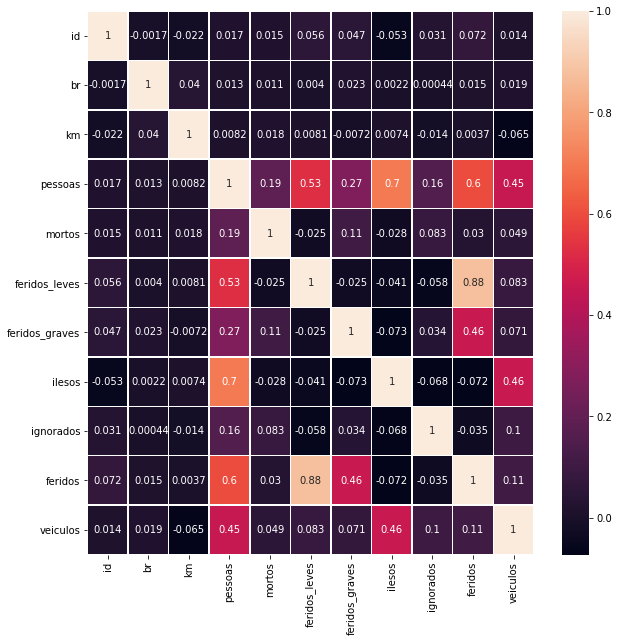

In [104]:
fig, ax = plt.subplots(figsize=(10,10))
sn.heatmap(dfOcorrencias.corr(), annot=True,  linewidths=.5, ax=ax)

plt.show()

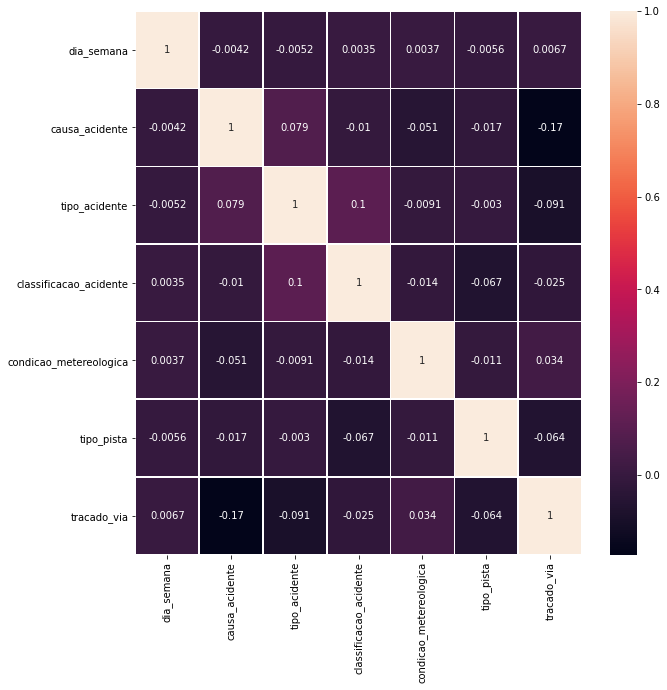

In [105]:
dfOcorrencias_codes = dfOcorrencias[["dia_semana","causa_acidente","tipo_acidente", "classificacao_acidente", "condicao_metereologica", "tipo_pista", "tracado_via"]].astype('category')
dfOcorrencias_codes.dia_semana = dfOcorrencias_codes.dia_semana.cat.codes
dfOcorrencias_codes.causa_acidente = dfOcorrencias_codes.causa_acidente.cat.codes
dfOcorrencias_codes.tipo_acidente = dfOcorrencias_codes.tipo_acidente.cat.codes
dfOcorrencias_codes.classificacao_acidente = dfOcorrencias_codes.classificacao_acidente.cat.codes
dfOcorrencias_codes.condicao_metereologica = dfOcorrencias_codes.condicao_metereologica.cat.codes
dfOcorrencias_codes.tipo_pista = dfOcorrencias_codes.tipo_pista.cat.codes
dfOcorrencias_codes.tracado_via = dfOcorrencias_codes.tracado_via.cat.codes

fig, ax = plt.subplots(figsize=(10,10))
sn.heatmap(dfOcorrencias_codes.corr(), annot=True,  linewidths=.5, ax=ax)
plt.show()

In [106]:
import plotly.express as px
fig = px.scatter_matrix(dfOcorrencias_codes)
fig.show()

##**Base 2: Agrupados por pessoa**

### **Hipótese 1:**

---

*Qual tipo de veículo que mais se envolve em acidentes?*

#### **Código:**

In [107]:
tipoveicAcidente= dfPessoas.groupby('tipo_veiculo').count().id.sort_values(ascending=False)
tipoveicAcidente

tipo_veiculo
Automóvel            273152
Motocicleta          110140
Caminhonete           54741
Caminhão-trator       49158
Caminhão              44522
Ônibus                23004
Camioneta             15451
Motoneta              12729
Bicicleta              7458
Utilitário             6753
Micro-ônibus           5515
Outros                 2528
Ciclomotor             1712
Semireboque            1069
Carroça-charrete        319
Trator de rodas         261
Reboque                 156
Não Informado            73
Triciclo                 60
Trem-bonde               28
Carro de mão             21
Trator misto             15
Chassi-plataforma         9
Trator de esteira         9
Quadriciclo               8
Name: id, dtype: int64

#### **Gráfico:**

In [108]:
df = dfPessoas.groupby([dfPessoas['data_inversa'].dt.strftime('%Y'), 'tipo_veiculo']).count().id.sort_values(ascending=False).reset_index()
df.columns = ['Ano', 'Tipo do Veículo', 'Qtd Acidentes']
px.bar(df, x='Tipo do Veículo', y='Qtd Acidentes', animation_frame='Ano', title='Quantidade de acidentes por tipo de veículo')

#### **Conclusão:** 

>Observa-se que, os veículos que mais estão envolvidos em acidentes são os automóveis, seguidos de motocicletas e caminhonetes. E, por sua vez, o número de chassi-plataformas, tratores de esteira e quadriciclos, envolvidos, é quase insignificante se comparado.


### **Hipótese 2**
---


*Qual a chance de um passageiro sair ileso em um acidente?*

#### **Código:**

In [109]:
todos = dfPessoas.id.count()
passageiros_ilesos = dfPessoas[(dfPessoas['tipo_envolvido'] == 'Passageiro') & (dfPessoas['estado_fisico'] == 'Ileso')].id.count()
print(f'Um passageiro tem {passageiros_ilesos * 100 / todos:.2f} % de sair ileso em um acidente!')

Um passageiro tem 8.56 % de sair ileso em um acidente!


#### **Conclusão:**


>Nota-se que, somente 8,56% dos passageiros saem ilesos de um acidente. Por consequência, 91,44% das pessoas envolvidas têm alguma tipo de decorrência.




### **Hipótese 3**


---

*Qual a taxa de mortes para cada faixa etária?*


>As faixas etárias consideradas seguem os seguintes parâmetros:  Criança (0-12), Jovem (12-24), Adulto (24-60), Idoso (60-110)

#### **Código:**

In [110]:
dfPessoasMortos = dfPessoas[dfPessoas['mortos'] == 1]
todosMortos = dfPessoasMortos.id.count()
dfPessoasMortos.groupby(pd.cut(dfPessoasMortos.idade, [0, 12, 24, 60, 110])).count().id.sort_values(ascending=False).apply(lambda x: f'{100 * x / todosMortos:.2f} %')

idade
(24, 60]     70.72 %
(12, 24]     14.73 %
(60, 110]    12.18 %
(0, 12]       2.15 %
Name: id, dtype: object

#### **Gráfico:**

In [111]:
df = dfPessoasMortos.groupby(pd.cut(dfPessoasMortos.idade, [0, 12, 24, 60, 110])).count().id.apply(lambda x: 100 * x / todosMortos).reset_index()
df.columns = ['Faixa de idade', 'Taxa de mortalidade em acidentes']
df['Faixa de idade'] = df['Faixa de idade'].astype(str)
px.pie(df, names='Faixa de idade', values='Taxa de mortalidade em acidentes', hole=.5, title='Taxa de Mortes para Cada Faixa de idade')


#### **Conclusão:**


>Verifica-se que o número de adultos envolvidos em acidentes é superior as demais faixas etárias, apresentando-se em 70.72% dos casos. Seguidos por jovens, onde esse número cai para 14,73% e adiante por idosos, que representam 12,18%. Por fim, o número de crianças envolvidas é ainda menor, sendo de apenas 2,15%.




### **Hipótese 4:**


---

*Lesões sofridas nos acidentes, a partir da abordagem do sexo do agente Pessoa*

#### **Código:**

In [112]:
lesoes = dfPessoas[dfPessoas['estado_fisico'].str.contains('Lesões')].groupby('sexo').count().id.sort_values(ascending=False)
lesoes

sexo
Masculino        193569
Feminino          83938
Não Informado       413
Name: id, dtype: int64

#### **Gráfico:**

In [113]:
df = dfPessoas[dfPessoas['estado_fisico'].str.contains('Lesões')].groupby('sexo').count().id.reset_index()
df.columns = ['Estado Físico', 'Sexo']
px.pie(df, names='Estado Físico', values='Sexo', hole=.5, title='Lesões sofridas de acordo com o sexo')

#### **Conclusão:**

>Identifica-se assim, que o número de lesões sofridas por sexo masculino é superior ao de lesões sofridas por sexo feminino. 




### **Correlações**

---

*Gráficos de correlação da base de Pessoas*

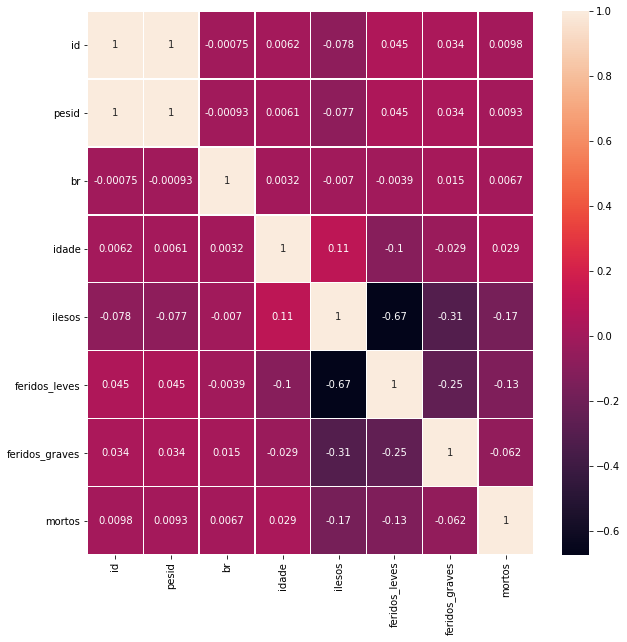

In [114]:
fig, ax = plt.subplots(figsize=(10,10))
sn.heatmap(dfPessoas.corr(), annot=True,  linewidths=.5, ax=ax)
plt.show()

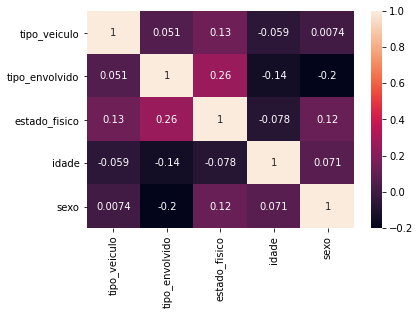

In [115]:
dfPessoas_codes = dfPessoas[['tipo_veiculo', 'tipo_envolvido', 'estado_fisico', 'idade', 'sexo']].astype('category')
dfPessoas_codes.tipo_veiculo = dfPessoas_codes.tipo_veiculo.cat.codes
dfPessoas_codes.tipo_envolvido = dfPessoas_codes.tipo_envolvido.cat.codes
dfPessoas_codes.estado_fisico = dfPessoas_codes.estado_fisico.cat.codes
dfPessoas_codes.idade = dfPessoas_codes.idade.cat.codes
dfPessoas_codes.sexo = dfPessoas_codes.sexo.cat.codes

sn.heatmap(dfPessoas_codes.corr(), annot=True)
plt.show()

In [116]:
import plotly.express as px
fig = px.scatter_matrix(dfPessoas_codes)
fig.show()